In [1]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from harris.harris import harris

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Images loaded successfully!
Images loaded successfully!
Images loaded successfully!


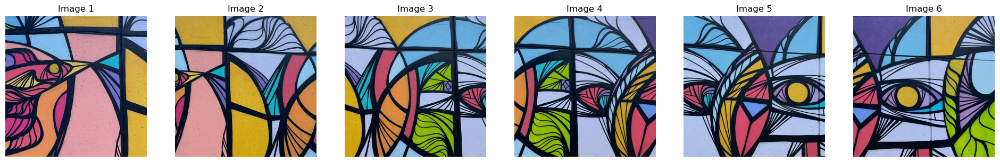

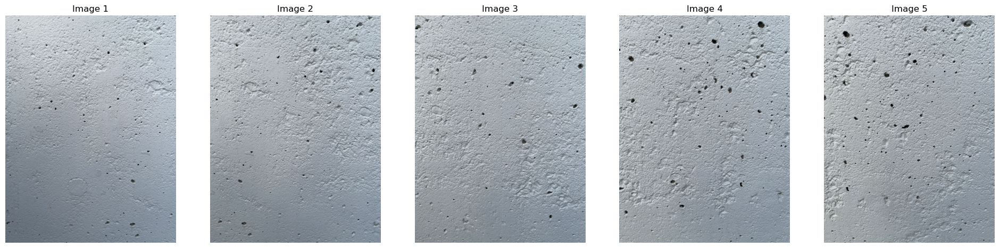

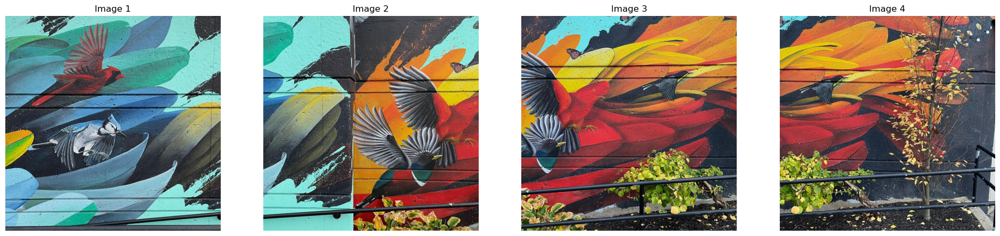

In [2]:
# Load and Display Images
path = "./Data/Mural_Base"
path_conc = "./Data/Concrete"
path_mural = "./Data/Mural_New"
images = load_images(path) # Loads images into an array
images_conc = load_concrete_images(path_conc)
images_mural = load_images(path_mural)

In [28]:
def detect_and_compute_keypoints(img):
    """
    Detect keypoints and compute descriptors for each image using SIFT.
    """
    keypoints = []
    descriptors = []
    grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    ys, xs, resp = harris(grayscale, N=500, thresh=9999999, hsize=5, sigma=2)


    kp = [cv2.KeyPoint(float(x), float(y), 9) for y, x in zip(ys, xs)]
    
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.compute(grayscale, kp)

    return keypoints, descriptors

In [4]:
def stitch_images(img1, img2, kp1, kp2, matches):
    """
    Stitch two images together using matched keypoints and RANSAC to find homography.
    This version adds padding based on detected alignment (left or right).
    """
    # Extract matched keypoints
    img1_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img2_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # Compute homography matrix using RANSAC
    H, mask = cv2.findHomography(img1_pts, img2_pts, cv2.RANSAC, 3.0)
    img1_warped, img2_padded = warpPerspectivePadded(img1, img2, H)
    stitched_image = masking(img1_warped, img2_padded, 0.5)
    result = np.uint8(stitched_image)
    
    return result

In [23]:
def create_panorama(images):
    """
    Create a panorama from a list of images.
    """
    stitched_image = images[0]  # Start with the first image
    for i in range(1, len(images)):
        print(f"Stitching image {i-1} and {i}...")
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])
        
        # Match features
        matches = match_features(descriptors1, descriptors2)
        print(f"Number of good matches between stitched image and image {i}: {len(matches)}")

        draw_matches(stitched_image, images[i], keypoints1, keypoints2, matches, num_matches=50)
        
        # Stitch the current pair of images
        stitched_image = stitch_images(stitched_image, images[i], keypoints1, keypoints2, matches)
    
    return stitched_image

In [6]:
def display_pano(panorama):
    # Display the final panorama
    plt.figure(figsize=(15, 10))
    plt.imshow(panorama)
    plt.title("Panorama Image")
    plt.axis("off")
    plt.show()

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 30


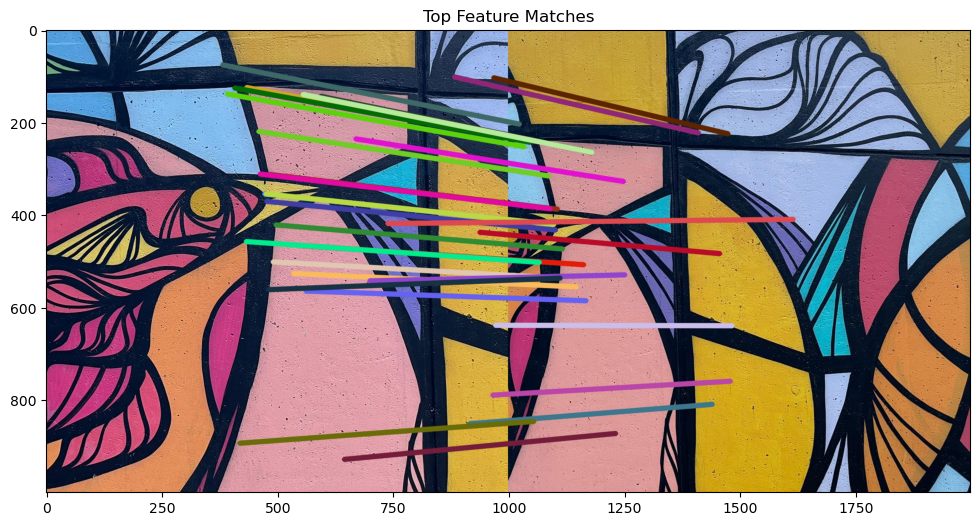

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 23


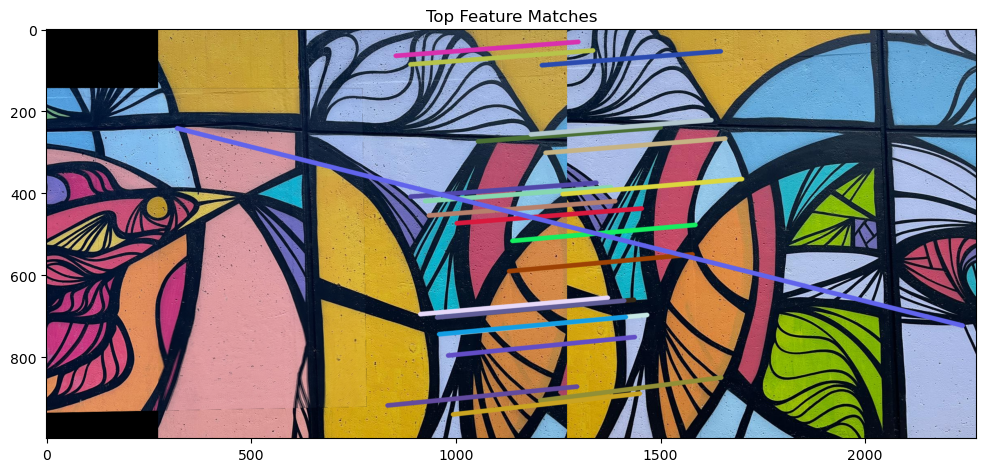

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 69


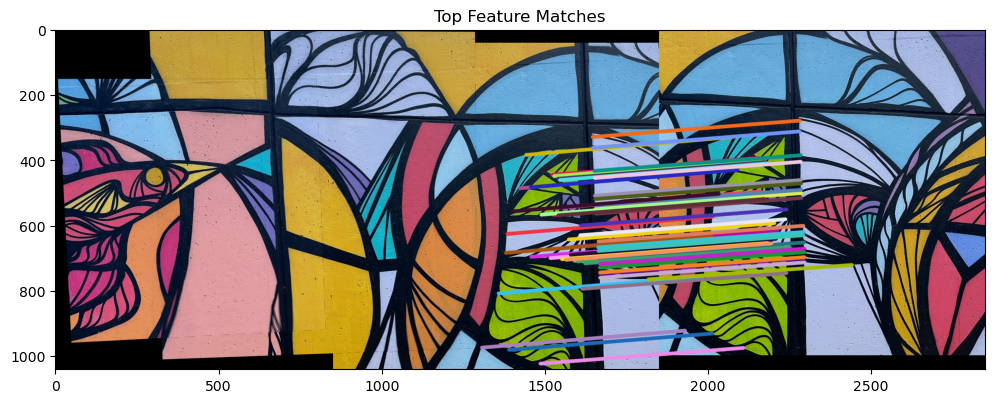

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 54


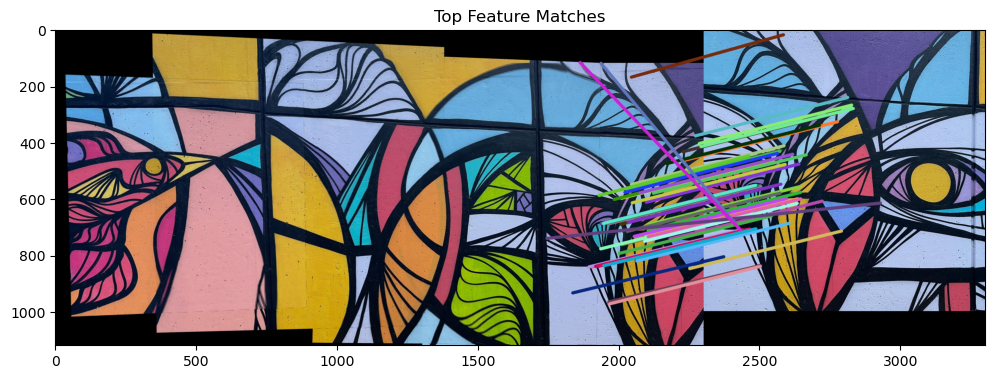

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 116


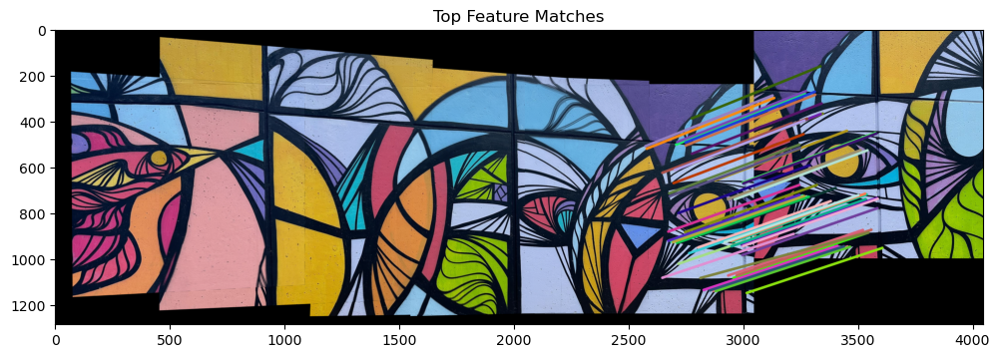

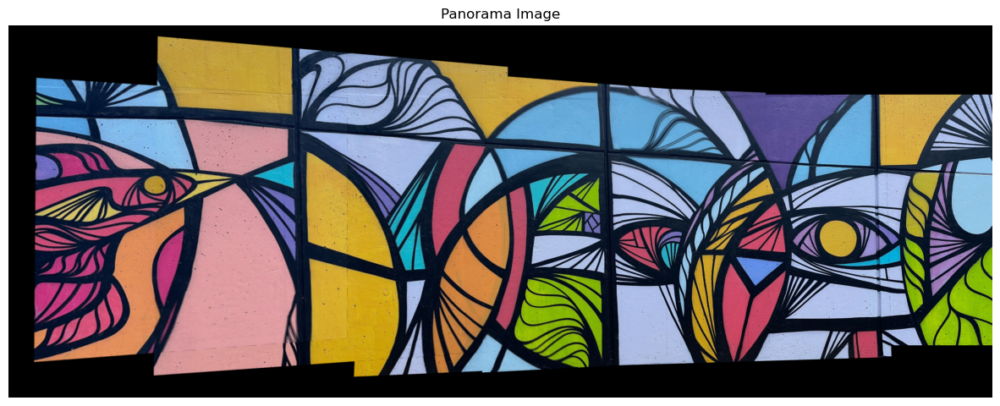

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 165


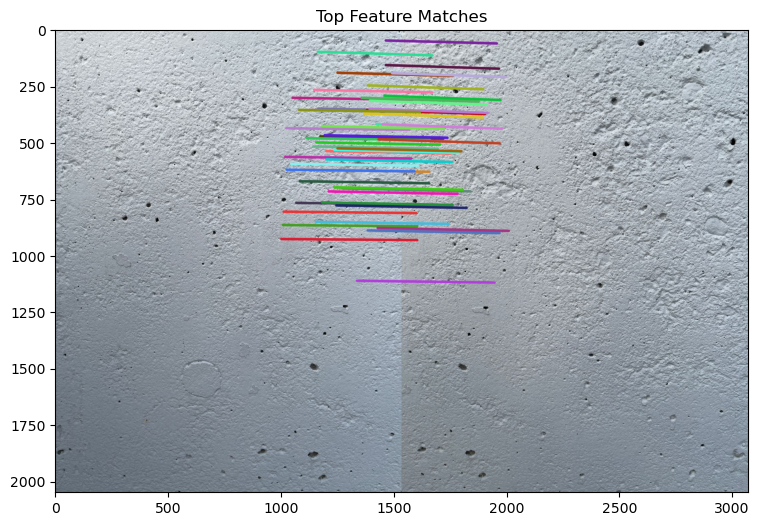

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 44


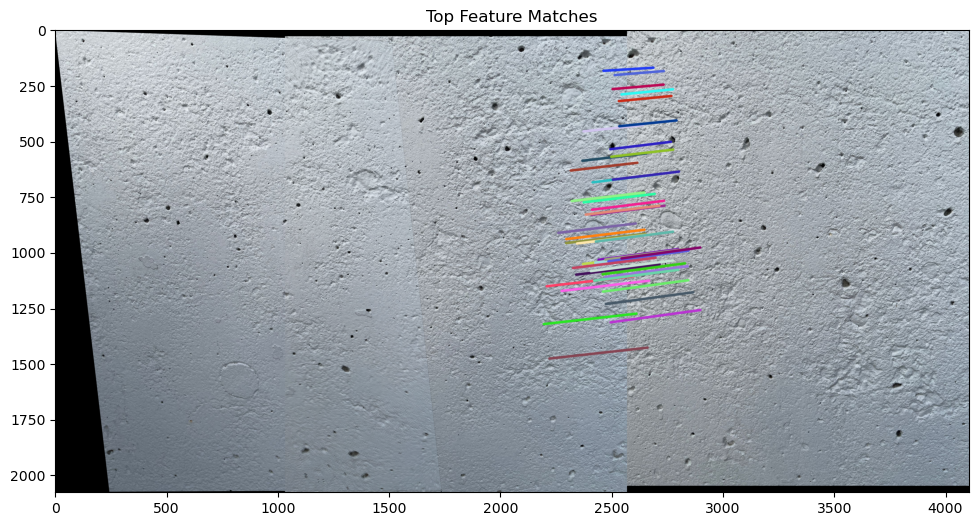

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 28


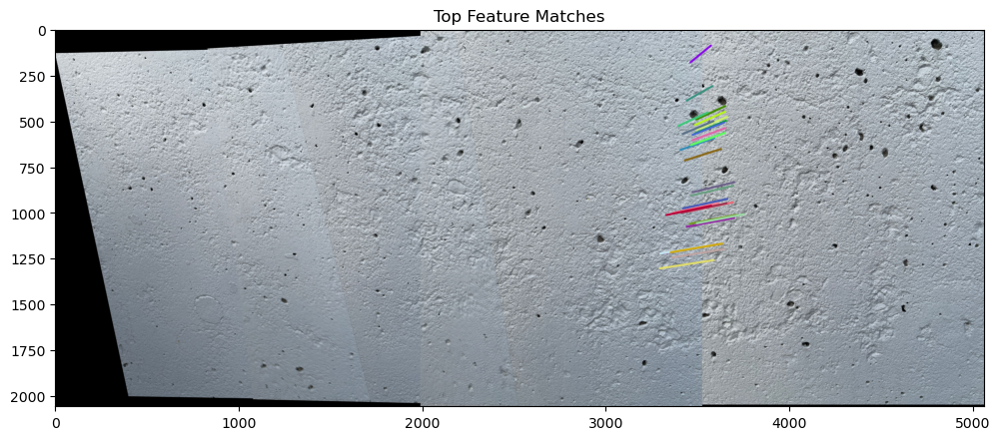

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 93


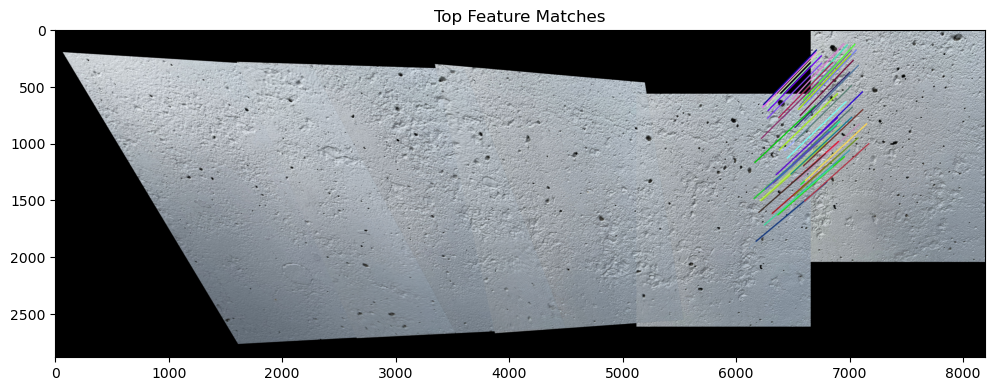

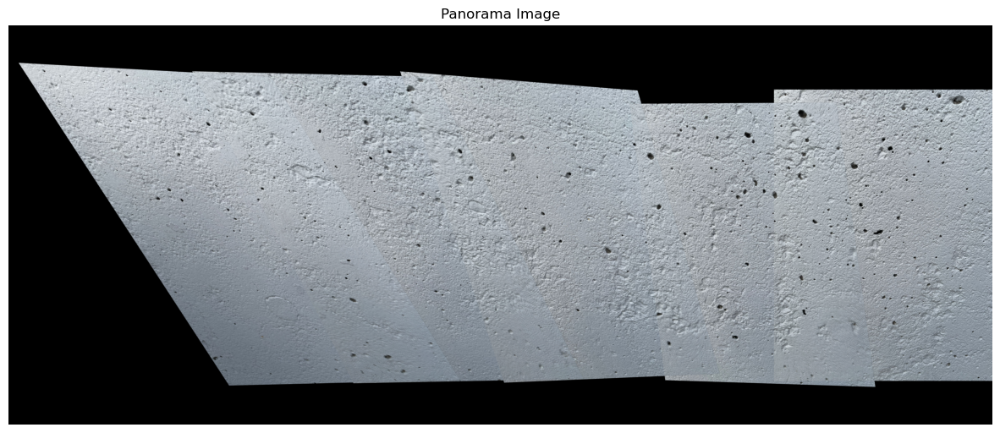

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 103


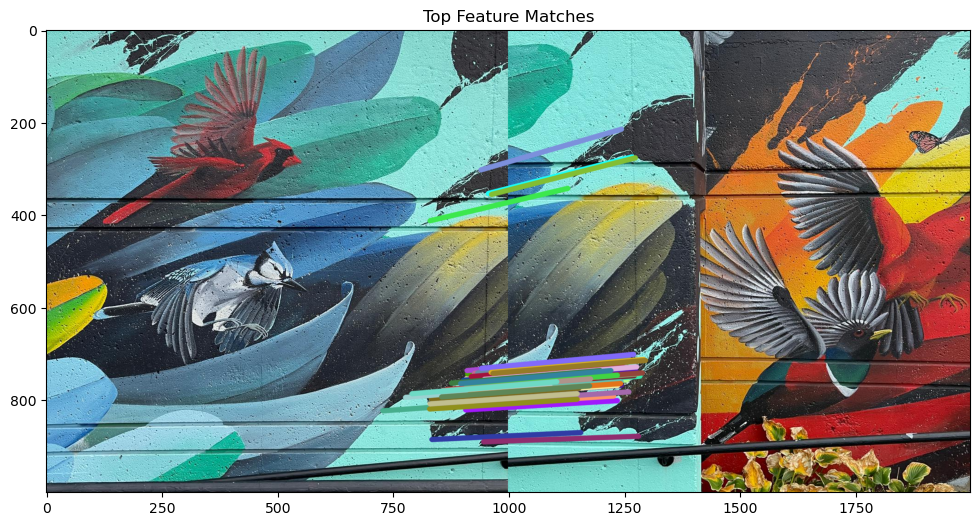

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 49


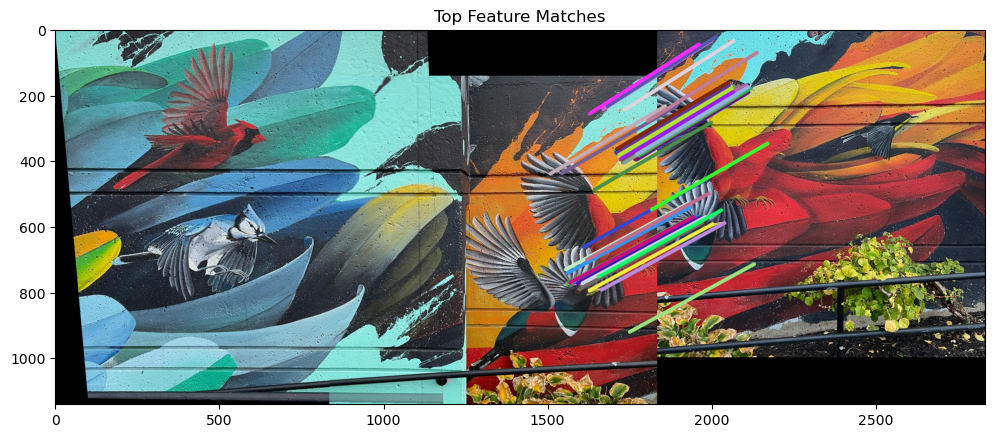

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 11


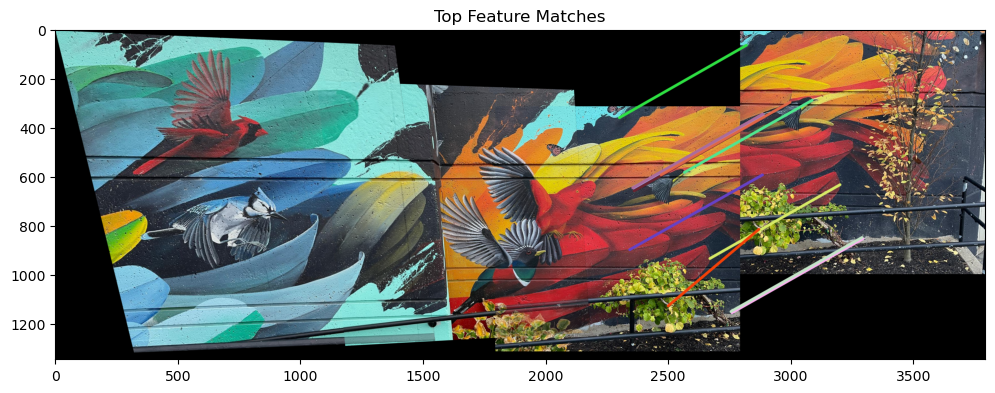

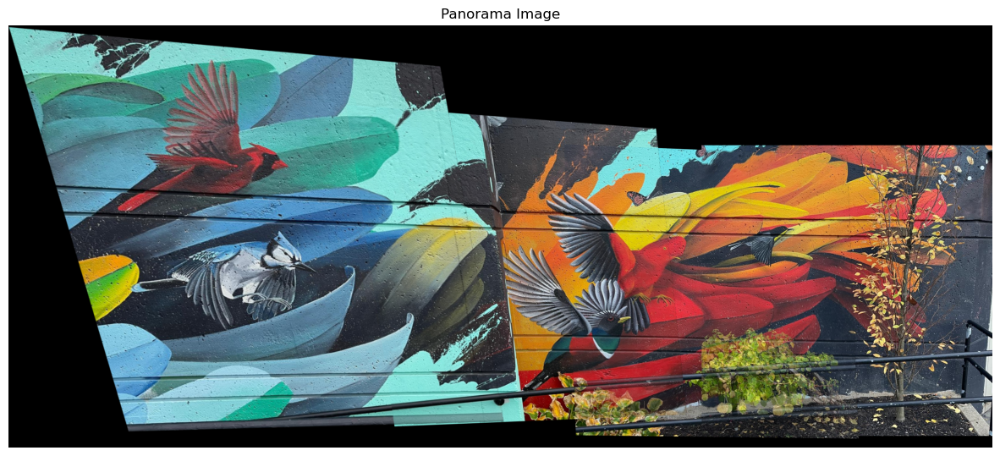

In [29]:
panorama = create_panorama(images)
display_pano(panorama)
panorama_conc = create_panorama(images_conc)
display_pano(panorama_conc)
panorama_mural = create_panorama(images_mural)
display_pano(panorama_mural)


Changes made:

Harris Corner Paramters tuned:
- RANSAC Reproj Threshold
- Masking Alpha
- Maximum # Interest points in Harris Corner Detection
- Keypoint size
- Gaussian Smoothing Mask Size
- Gaussian Filter Standard Deviation
- Minimum allowable response threshold

Code Changes:
- Mural Images Loaded at 1000x1000 (Concrete lost too much resolution and/or coverage in resize)
- Defined display_pano function to be used for each panorama case

Analysis:

The mosaic algorithm using the harris corner detection provided for the lab, with some parameter tuning, does a fairly decent job of identifying and matching keypoints in order to construct a panorama of a scene, provided the scene has distinguishable features. In the case of the murals, the vibrant colors provide for better edge detection, even if there is only 15% overlap in the images, although converting the image to grayscale before computing allows for false positives when two corners at a similar angle have hues that convert to the same grayscale hue. In the case of the concrete wall, however, the specks in the wall are the most prominent features, but can often produce false positives if two different specks look the same.